<a href="https://colab.research.google.com/github/kirat-anand-68/DATASCIENCE/blob/main/DOGv_sCAT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

DOWNLOAD DATASET

In [1]:
!wget https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip

--2026-03-02 16:33:15--  https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.222.206.35, 2600:1406:5400:290::317f, 2600:1406:5400:2ae::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.222.206.35|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M   108MB/s    in 13s     

2026-03-02 16:33:28 (61.6 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



UNZIP THE DATASET

In [2]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

IMPORT THE MODULES

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import seaborn
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

## CREATE DATAFRAME FOR INPUT AND THE OUTPUT


In [19]:
input_path = []
label = []
for class_name in os.listdir("PetImages"):
  for path in os.listdir("PetImages/"+class_name):
    if class_name== 'Cat':
      label.append(0)
    else:
      label.append(1)
    input_path.append(os.path.join("PetImages",class_name,path))
print()



In [20]:
len(label)

25002

In [21]:
len(input_path)

25002

In [22]:
df=pd.DataFrame()
df['Images']=input_path
df['label']=label
df=df.sample(frac=1).reset_index(drop=True)
df.head()

,Images,label
0,PetImages/Cat/8401.jpg,0
1,PetImages/Cat/4137.jpg,0
2,PetImages/Cat/9699.jpg,0
3,PetImages/Dog/3621.jpg,1
4,PetImages/Dog/9111.jpg,1


EDA

In [51]:
for i in df['Images']:
  if'.jpg' not in i:
    print(i)

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [52]:
#Delete db files

df = df[df['Images']!='PetImages/Dog/Thumbs.db']
df= df[df['Images']!='PetImages/Cat/Thumbs.db']
len(df)

25000

In [56]:
import PIL
l=[]
for image in df['Images']:
  try:
    img=PIL.Image.open(image)
  except:
    l.append(image)
l

['PetImages/Cat/666.jpg', 'PetImages/Dog/11702.jpg']

In [57]:
#Deleting the db files
df = df[df['Images']!='PetImages/Dog/Thumbs.db']
df= df[df['Images']!='PetImages/Cat/Thumbs.db']
df = df[df['Images']!='PetImages/Cat/666.jpg']
df= df[df['Images']!='PetImages/Dog/11702.jpg']
len(df)

24998

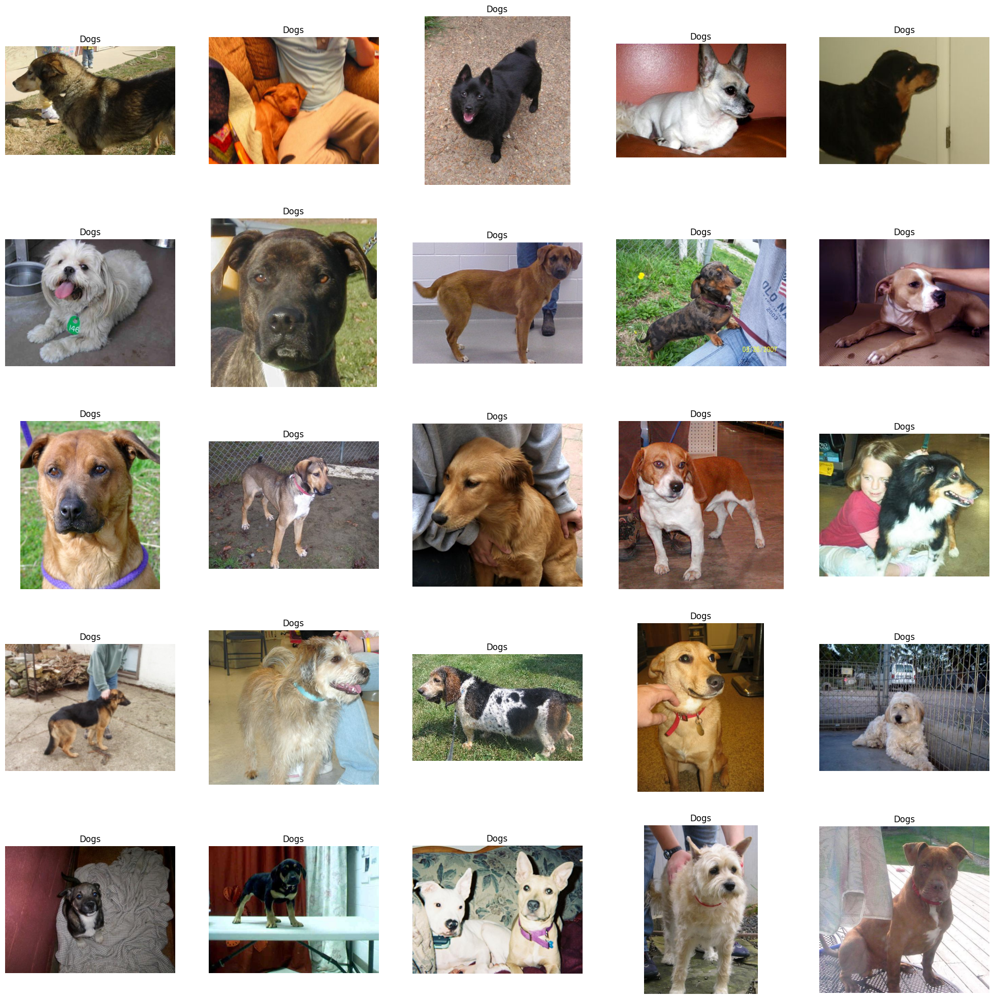

In [25]:
#to display grid of images
plt.figure(figsize=(25,25))
temp=df[df['label']==1]['Images']
start = random.randint(0,len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title('Dogs')
  plt.axis('off')

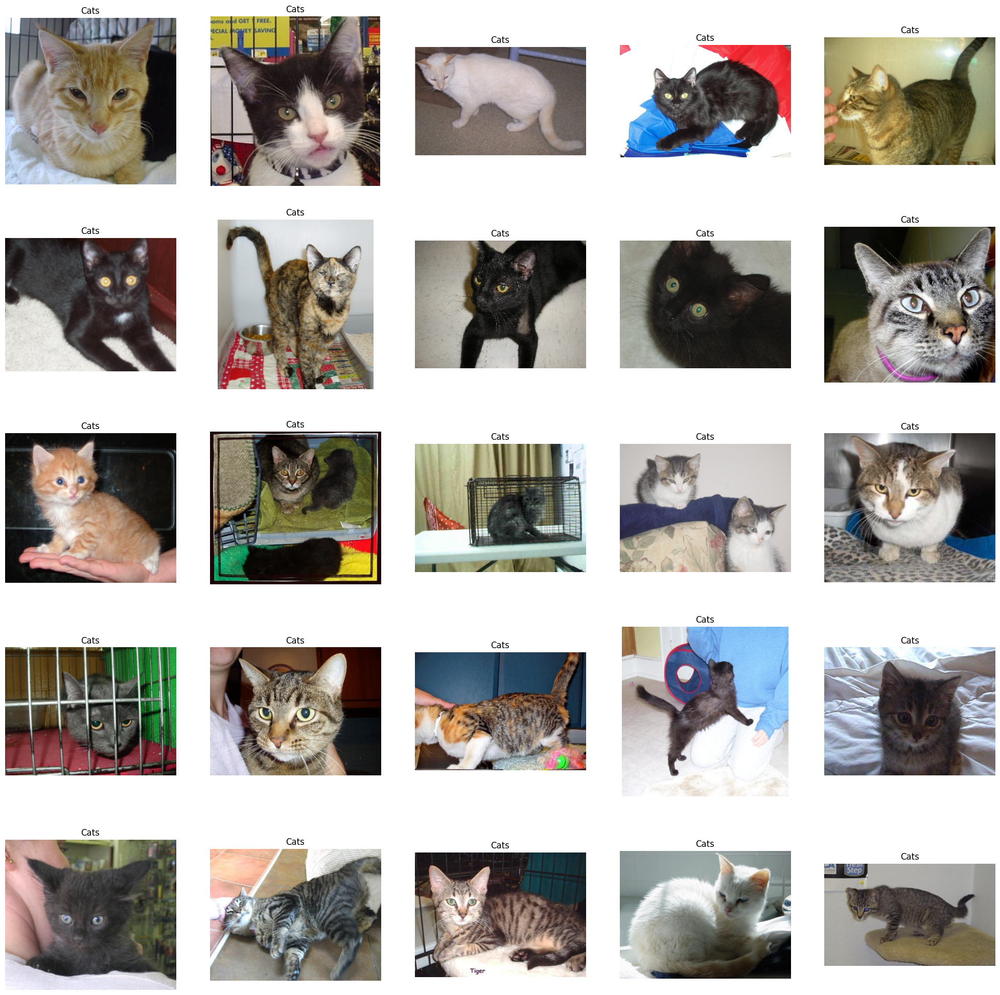

In [26]:
plt.figure(figsize=(25,25))
temp=df[df['label']==0]['Images']
start = random.randint(0,len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title('Cats')
  plt.axis('off')

In [58]:
df['label']=df['label'].astype('str')

CREATE DATA GENERATOR FOR THE IMAGES

In [59]:
#INPUT SPLIT
from sklearn.model_selection import train_test_split
train,test=train_test_split(df,test_size=0.2,random_state=42)

In [60]:
train.head()

,Images,label
23290,PetImages/Dog/145.jpg,1
17784,PetImages/Dog/8452.jpg,1
1020,PetImages/Dog/4680.jpg,1
12645,PetImages/Dog/7597.jpg,1
1533,PetImages/Cat/2219.jpg,0


In [61]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_generator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_generator=ImageDataGenerator(rescale=1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='Images',     # make sure name matches
    y_col='label',
    target_size=(128,128),
    batch_size=32,      # 512 is too large usually
    class_mode='binary'
)
val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='Images',     # make sure name matches
    y_col='label',
    target_size=(128,128),
    batch_size=32,      # 512 is too large usually
    class_mode='binary'
)




Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


MODEL CREATION


In [62]:
from keras import Sequential
from keras.layers import Conv2D,MaxPool2D,Flatten,Dense

model=Sequential([
    Conv2D(16,(3,3),activation='relu',input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(64,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512,activation='relu'),
    Dense(1,activation='sigmoid')

])

In [63]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [65]:
history=model.fit(train_iterator,epochs=10,validation_data=val_iterator)

Epoch 1/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 108s 173ms/step - accuracy: 0.7143 - loss: 0.5504 - val_accuracy: 0.7670 - val_loss: 0.4879
Epoch 2/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 108s 172ms/step - accuracy: 0.7528 - loss: 0.5047 - val_accuracy: 0.7654 - val_loss: 0.4951
Epoch 3/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 108s 173ms/step - accuracy: 0.7687 - loss: 0.4780 - val_accuracy: 0.7930 - val_loss: 0.4467
Epoch 4/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 108s 173ms/step - accuracy: 0.7895 - loss: 0.4468 - val_accuracy: 0.8066 - val_loss: 0.4304
Epoch 5/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 108s 172ms/step - accuracy: 0.8021 - loss: 0.4277 - val_accuracy: 0.8112 - val_loss: 0.4068
Epoch 6/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 110s 177ms/step - accuracy: 0.8116 - loss: 0.4054 - val_accuracy: 0.7878 - val_loss: 0.4558
Epoch 7/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 109s 175ms/step - accuracy: 0.8227 - loss: 0.3866 - val_accuracy: 0.8266 - val_loss: 0.3780
Epoch 8/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 113s 181ms/step - accuracy: 0.8310 -

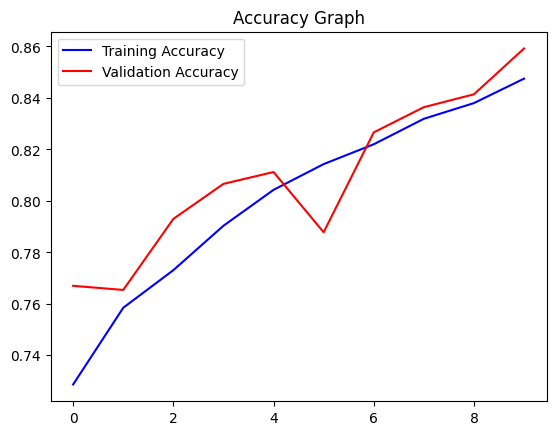

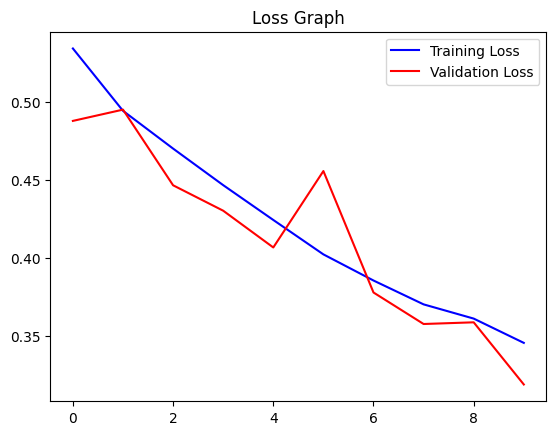

In [67]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']
epochs=range(len(acc))

plt.plot(epochs,acc,'b',label='Training Accuracy')
plt.plot(epochs,val_acc,'r',label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss=history.history['loss']
val_loss=history.history['val_loss']
plt.plot(epochs,loss,'b',label='Training Loss')
plt.plot(epochs,val_loss,'r',label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()